In [39]:
import os
if os.getcwd() == '/home/hanseungsoo/project/ZS-CIR':
    os.chdir('/home/hanseungsoo/project/ZS-CIR/RegionCLIP')
else:
    pass
print(os.getcwd())


/home/hanseungsoo/project/ZS-CIR/RegionCLIP


In [43]:
import torch
encoder = torch.load('./pretrained_ckpt/regionclip/regionclip_pretrained-cc_rn50.pth')

for i in encoder['model']:
    print(i,encoder['model'][i].shape)

/tmp/ipykernel_10576/2259399144.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  encoder = torch.load('./pretrained_ckpt/regionclip/regionclip_pretrained-cc_rn50.pth')


offline_backbone.fpn_lateral2.weight torch.Size([256, 256, 1, 1])
offline_backbone.fpn_lateral2.bias torch.Size([256])
offline_backbone.fpn_output2.weight torch.Size([256, 256, 3, 3])
offline_backbone.fpn_output2.bias torch.Size([256])
offline_backbone.fpn_lateral3.weight torch.Size([256, 512, 1, 1])
offline_backbone.fpn_lateral3.bias torch.Size([256])
offline_backbone.fpn_output3.weight torch.Size([256, 256, 3, 3])
offline_backbone.fpn_output3.bias torch.Size([256])
offline_backbone.fpn_lateral4.weight torch.Size([256, 1024, 1, 1])
offline_backbone.fpn_lateral4.bias torch.Size([256])
offline_backbone.fpn_output4.weight torch.Size([256, 256, 3, 3])
offline_backbone.fpn_output4.bias torch.Size([256])
offline_backbone.fpn_lateral5.weight torch.Size([256, 2048, 1, 1])
offline_backbone.fpn_lateral5.bias torch.Size([256])
offline_backbone.fpn_output5.weight torch.Size([256, 256, 3, 3])
offline_backbone.fpn_output5.bias torch.Size([256])
offline_backbone.bottom_up.stem.conv1.weight torch.Siz

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

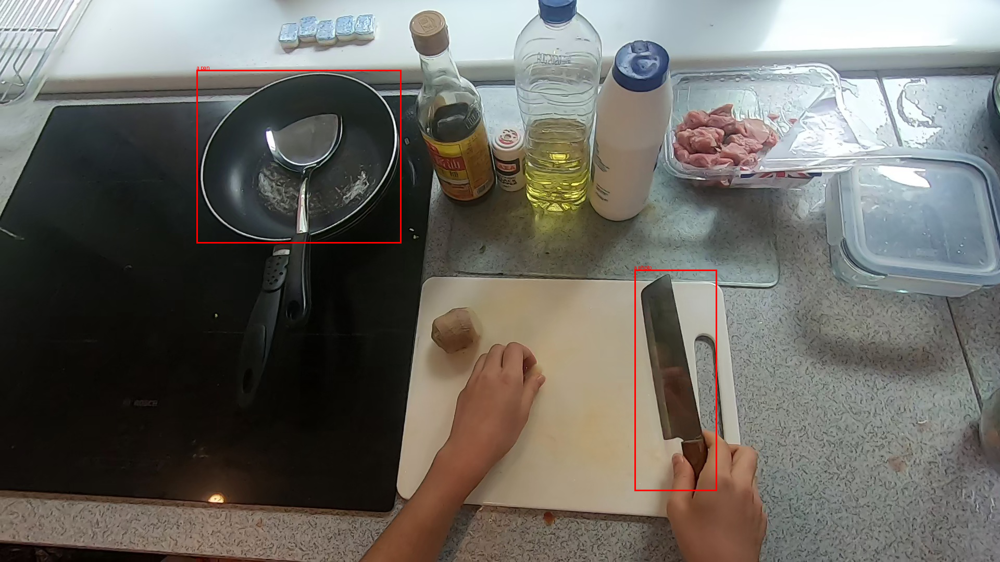

In [110]:
# https://huggingface.co/docs/transformers/model_doc/grounding-dino

import torch
import requests
from PIL import Image, ImageDraw
from transformers import AutoProcessor, AutoModelForZeroShotObjectDetection

model_id = "IDEA-Research/grounding-dino-tiny"
device = "cuda"

processor = AutoProcessor.from_pretrained(model_id)
model = AutoModelForZeroShotObjectDetection.from_pretrained(model_id).to(device)

# Load image from your local storage
image_path = "http://images.cocodataset.org/val2017/000000039769.jpg"  # Replace with your actual file path
image = Image.open('./datasets/custom_images/sample_img2.jpg')

# Check for cats and dogs
text = " a photo of knife. a pan."

inputs = processor(images=image, text=text, return_tensors="pt").to(device)
with torch.no_grad():
    outputs = model(**inputs)

results = processor.post_process_grounded_object_detection(
    outputs,
    inputs.input_ids,
    box_threshold=0.4,
    text_threshold=0.3,
    target_sizes=[image.size[::-1]]
)

draw_image = image.copy()
draw = ImageDraw.Draw(draw_image)
for box, label in zip(results[0]["boxes"], results[0]["labels"]):
    box = box.cpu().numpy()  # Convert to numpy array for easy manipulation
    draw.rectangle(box.tolist(), outline="red", width=3)
    
    text_position = (box[0], box[1] - 10 if box[1] - 10 > 0 else box[1])
    
    draw.text(text_position, label, fill="red")

draw_image.show()

#image.save("data/output/detected_people4.jpg")

In [36]:
print(results)

[{'scores': tensor([0.4785, 0.4381, 0.4759], device='cuda:0'), 'labels': ['a cat', 'a cat', 'a remote control'], 'boxes': tensor([[344.6933,  23.1090, 637.1844, 374.2747],
        [ 12.2651,  51.9149, 316.8590, 472.4387],
        [ 38.5835,  70.0063, 176.7782, 118.1764]], device='cuda:0')}]


In [102]:
import pandas as pd
import os
print(os.getcwd())
image_path = './datasets/custom_images'
images = os.listdir(image_path)[:-1]
texts = [ 'a knife. a pan.','a photo of right plant. a white basket.',"a photo of cat. a remote control.",]
images[1],images[2] = images[2],images[1] 
texts[1],texts[2] = texts[2],texts[1] 

samples = pd.DataFrame({'images':images,'texts':texts})
samples.to_csv(os.path.join(image_path,'samples.csv'),index=False)

/home/hanseungsoo/project/ZS-CIR/RegionCLIP


In [103]:
samples

,images,texts
0,sample_img2.jpg,a knife. a pan.
1,000000039769.jpg,a cat. a remote control.
2,sample_img1.jpg,a photo of right plant. a white basket.


In [105]:
import torch
encoder = torch.load('./output/region_feats/custom_images.pth')

'''for i in encoder['model']:
    print(i,encoder['model'][i].shape)'''

print(encoder)

[[{'boxes': [tensor([[ 378.4716,  133.6825,  769.8005,  467.7695],
        [1221.3052,  519.3453, 1370.9376,  941.3959]])], 'classes': [['a pan', 'a knife']], 'probs': [tensor([0.6310, 0.6373])], 'feats': tensor([[-0.3504, -0.0156, -0.3485,  ...,  0.0783, -0.2823, -0.4863],
        [ 1.1508,  0.2266, -0.0469,  ...,  0.1866, -1.1034,  0.1283]])}, './datasets/custom_images/sample_img2.jpg'], [{'boxes': [tensor([[344.6933,  23.1090, 637.1844, 374.2747],
        [ 12.2651,  51.9149, 316.8590, 472.4387],
        [ 38.5835,  70.0063, 176.7782, 118.1764]])], 'classes': [['a cat', 'a cat', 'a remote control']], 'probs': [tensor([0.4785, 0.4381, 0.4759])], 'feats': tensor([[ 0.0100,  0.5886, -0.0352,  ..., -0.7814, -0.5643,  0.4199],
        [-0.1788,  0.3719,  0.2863,  ..., -0.8587, -0.5336, -0.3148],
        [ 0.4431,  0.3868,  0.4187,  ..., -0.1568,  0.0855, -0.6904]])}, './datasets/custom_images/000000039769.jpg'], [{'boxes': [tensor([[ 120.4559,  549.4021,  682.1841, 1037.1025]])], 'classe

/tmp/ipykernel_10576/2915128593.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  encoder = torch.load('./output/region_feats/custom_images.pth')


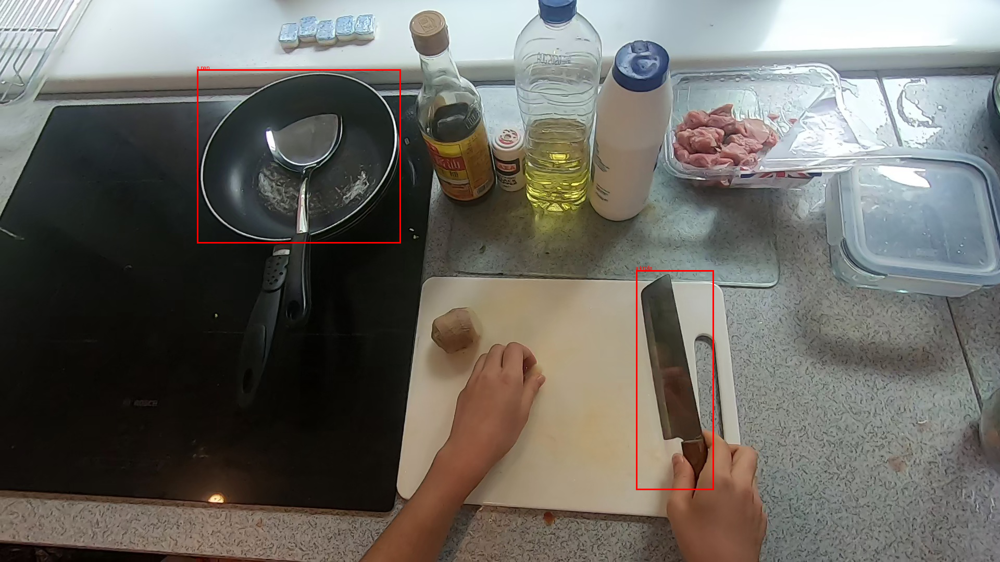

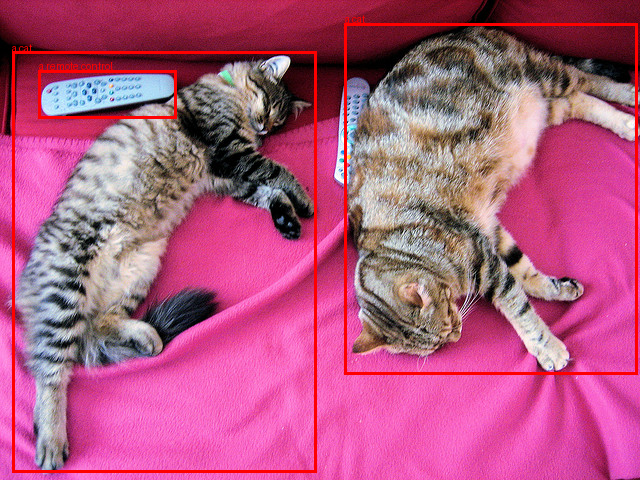

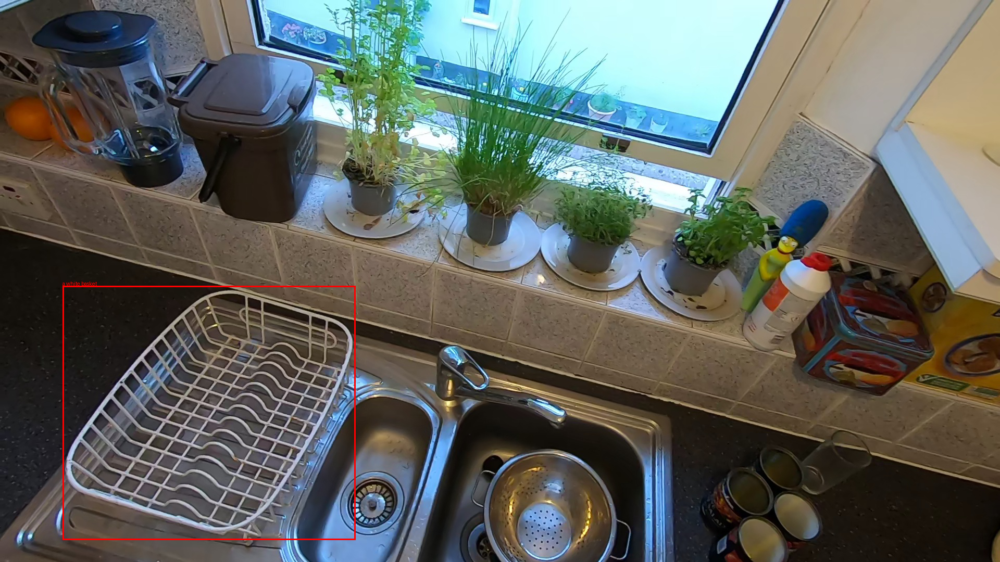

In [106]:
for e in encoder:
    img = Image.open(e[1])
    draw = ImageDraw.Draw(img)
    for box, label in zip(e[0]["boxes"][0], e[0]["classes"][0]):
        box = box.cpu().numpy()  # Convert to numpy array for easy manipulation
        draw.rectangle(box.tolist(), outline="red", width=3)
        
        text_position = (box[0], box[1] - 10 if box[1] - 10 > 0 else box[1])
        
        draw.text(text_position, label, fill="red")

    img.show()


In [34]:
image.size

(640, 480)

In [7]:
import json
with open("./RegionCLIP/datasets/lvis/lvis_v1_val/lvis_v1_val.json", "r") as f:
	data = json.load(f)


In [8]:
len(data['images'])

19809

In [9]:
images = [img['coco_url'] for img in data['images']]
height = [img['height'] for img in data['images']]
width = [img['width'] for img in data['images']]
image_id = [img['id'] for img in data['images']]

image_data = pd.DataFrame({'image':images,'height':height,'width':width,'image_id':image_id})

In [10]:
bbox = [annot['bbox'] for annot in data['annotations']]
category_id = [annot['category_id'] for annot in data['annotations']]
image_id = [annot['image_id'] for annot in data['annotations']]

annot_data = pd.DataFrame({'image_id':image_id,'category_id':category_id,'bbox':bbox,})

In [11]:
image_data['image'][0]

'http://images.cocodataset.org/val2017/000000397133.jpg'

In [12]:
print(image_data.shape,annot_data.shape)

(19809, 4) (244707, 3)


In [13]:
image_annot_data = pd.merge(annot_data,image_data,how='left',on = 'image_id')

In [14]:
data['categories'][0]

{'image_count': 8,
 'synonyms': ['aerosol_can', 'spray_can'],
 'def': 'a dispenser that holds a substance under pressure',
 'id': 1,
 'synset': 'aerosol.n.02',
 'name': 'aerosol_can',
 'frequency': 'c',
 'instance_count': 11}

In [15]:
category_id = [cate['id'] for cate in data['categories']]
synonyms = [syn for cate in data['categories'] for syn in cate['synonyms'] ]
name = [cate['name'] for cate in data['categories']]
text = ["A photo of " + cate['name'] for cate in data['categories']]

category_data = pd.DataFrame({'category_id':category_id,'name':name,'text':text})

In [16]:
image_annot_cate_data = pd.merge(image_annot_data,category_data,how='left',on = 'category_id')

In [17]:
image_annot_cate_data.head()

,image_id,category_id,bbox,image,height,width,name,text
0,446522,232,"[83.08, 219.88, 301.69, 420.12]",http://images.cocodataset.org/val2017/00000044...,640,480,chair,A photo of chair
1,446522,421,"[0.0, 0.0, 132.41, 629.18]",http://images.cocodataset.org/val2017/00000044...,640,480,refrigerator,A photo of refrigerator
2,76261,99,"[238.16, 340.87, 66.44, 47.08]",http://images.cocodataset.org/val2017/00000007...,427,640,bird,A photo of bird
3,76261,99,"[368.84, 181.21, 51.42, 59.88]",http://images.cocodataset.org/val2017/00000007...,427,640,bird,A photo of bird
4,454750,1202,"[0.0, 14.7, 413.66, 412.3]",http://images.cocodataset.org/val2017/00000045...,427,640,zebra,A photo of zebra


In [34]:
import os
import pandas as pd
output_dir = './RegionCLIP/datasets/lvis/lvis_v1_val_region/'

def make_save_path(image_url,bbox,category_id,path=output_dir):
    x = bbox[0]
    image_name = os.path.basename(image_url)[-16:-4] +'_' + str(x)[:2] + '_' + str(category_id)
    save_path = os.path.join(path, f"{image_name}.jpg")
    return save_path

save_pathes = []

for idx, row in image_annot_cate_data.iterrows():
    image_url = row['image']
    bbox = row['bbox']
    category_id = row['category_id']
    save_path = make_save_path(image_url,bbox,category_id)
    save_pathes.append(save_path)

dataset = pd.DataFrame({ 'filepath':save_pathes})
dataset['title'] = image_annot_cate_data['text']

In [35]:
dataset.head()

,filepath,title
0,./RegionCLIP/datasets/lvis/lvis_v1_val_region/...,A photo of chair
1,./RegionCLIP/datasets/lvis/lvis_v1_val_region/...,A photo of refrigerator
2,./RegionCLIP/datasets/lvis/lvis_v1_val_region/...,A photo of bird
3,./RegionCLIP/datasets/lvis/lvis_v1_val_region/...,A photo of bird
4,./RegionCLIP/datasets/lvis/lvis_v1_val_region/...,A photo of zebra


In [36]:
dataset.to_csv('./composed_image_retrieval/cc/valid_lvis_output.csv',index=False)

In [176]:
# 저장할 경로 설정
from io import BytesIO

output_dir = './datasets/lvis/lvis_v1_val_region/'
os.makedirs(output_dir, exist_ok=True)

def crop_and_save_image(image_url, bbox, category_id, save_dir):
    try:
        # URL에서 이미지 다운로드
        response = requests.get(image_url)
        if response.status_code == 200:
            img = Image.open(BytesIO(response.content))
            
            # BBox 좌표 (x_min, y_min, x_max, y_max)를 기준으로 크롭
            x, y, w, h = bbox
            x_min, y_min, x_max, y_max = x, y, x+w, y+h
            if x_min < x_max:
                if y_min < y_max :
                    cropped_img = img.crop((x_min, y_min, x_max, y_max))
                else:
                    cropped_img = img.crop((x_min, y_max, x_max, y_min))
            else:
                if y_min < y_max :
                    cropped_img = img.crop((x_max, y_min, x_min, y_max))
                else:
                    cropped_img = img.crop((x_max, y_max, x_min, y_min))
            
            # 파일 이름은 URL의 마지막 16자리 (확장자 제외)
            image_name = os.path.basename(image_url)[-16:-4] +'_' + str(x_min)[:2] + '_' + str(category_id)
            
            # 저장 경로
            save_path = os.path.join(save_dir, f"{image_name}.jpg")
            
            # 크롭된 이미지 저장
            cropped_img.save(save_path)
            print(f"Image saved: {save_path}")
        else:
            print(f"Failed to download image from {image_url}")
    except Exception as e:
        print(f"Error processing {image_url}: {e}")

# 데이터프레임을 순회하며 각 이미지 처리
for idx, row in image_annot_cate_data.iterrows():
    image_url = row['image']
    bbox = row['bbox']
    category_id = row['category_id']
    crop_and_save_image(image_url, bbox, category_id, output_dir)

Image saved: ./datasets/lvis/lvis_v1_val_region/000000446522_83_232.jpg
Image saved: ./datasets/lvis/lvis_v1_val_region/000000446522_0._421.jpg
Image saved: ./datasets/lvis/lvis_v1_val_region/000000076261_23_99.jpg
Image saved: ./datasets/lvis/lvis_v1_val_region/000000076261_36_99.jpg
Image saved: ./datasets/lvis/lvis_v1_val_region/000000454750_0._1202.jpg
Image saved: ./datasets/lvis/lvis_v1_val_region/000000454750_23_1202.jpg
Image saved: ./datasets/lvis/lvis_v1_val_region/000000113867_19_272.jpg
Image saved: ./datasets/lvis/lvis_v1_val_region/000000113867_34_1173.jpg
Image saved: ./datasets/lvis/lvis_v1_val_region/000000113867_0._811.jpg
Image saved: ./datasets/lvis/lvis_v1_val_region/000000113867_49_811.jpg
Image saved: ./datasets/lvis/lvis_v1_val_region/000000113867_48_811.jpg
Image saved: ./datasets/lvis/lvis_v1_val_region/000000498286_0._252.jpg
Image saved: ./datasets/lvis/lvis_v1_val_region/000000498286_0._378.jpg
Image saved: ./datasets/lvis/lvis_v1_val_region/000000475779_0.

KeyboardInterrupt: 